# **로드뷰 사진을 통해 서울 시내의 범죄 위험도를 알 수 있을까?**

- **연구 주제**
  - 로드뷰 사진을 통해 서울 시내의 범죄 위험도를 알 수 있을까?
  - 그것이 가능하다면, 로드뷰로 해당 도로의 범죄 위험도를 예측하고 위험한 지역의 건물이나 가로등 등의 지형지물을 수리함으로써 범죄를 예방할 수 있지 않을까?

- **주제 선정 동기**
>  범죄에 큰 관심이 없더라도 한번쯤은 들어봤을 법한 "깨진 유리창 이론"을 떠올리며 주제를 떠올리게 되었다. 깨진 유리창 하나를 방치해 두면 그 지점을 중심으로 범죄가 확산되기 시작한다고 주장하는 깨진 유리창 이론은 사소한 무질서를 방치하면 큰 문제로 이어질 가능성이 높다는 것을 시사하는 한편, 범죄가 발생하는 장소에 초점을 맞추고 있다. 범죄의 한 장면을 상상해보라 하면 많은 사람들이 쉽게 떠올릴 법한 장소와 그 느낌이 있다고 생각했고, 그러한 장소와 그 장소의 느낌을 바꾸어주면 범죄를 예방할 수 있을 것이라는 생각으로 연구를 시작하게 되었다.   
실제로 범죄학의 이론으로도 정립되어 있었는데, 일상활동이론(cohen & felson, 1979)에 따르면 범죄는 동기가 부여된 범죄자가 보호자가 없는 적절한 피해자를 시간과 공간적으로 동시에 만날 때 발생한다고 한다. 즉, 범죄 발생에 있어서 장소의 역할이 매우 중요하다. 범죄성(criminality)을 가진 범죄자들은 범죄에 대한 동기가 크게 부여되어 있을 수 있지만, 항상 범죄를 저지르는 것은 아니다. 따라서 어떠한 '상황'이, '장소'가 그들로 하여금 범죄를 저지르게 하는지 또는 억제하는지를 살펴보는 것은 중요하고 장소나 건물의 디자인을 변경함으로써 범죄율을 줄일 수 있을 것이라 생각하였다. 

- **연구 진행 순서**

  **1. 데이터 수집**
> 1) QGIS에서 구 레이어 안의 랜덤포인트를 200개씩 생성한 뒤, 해당 랜덤포인트의 위도, 경도를 카카오맵 사이트에 넣으며 로드뷰 사진 크롤링 (총 5000개)  
2) 해당 위도, 경도에 로드뷰가 없어 기본화면이 저장된 경우 등을 포함하여 의미 없는 사진을 삭제한 뒤, 필요한 부분만 정사각형으로 자름 (최종 데이터 개수 2663개)

  **2. 데이터 전처리**
> 1) 각 범죄 별로 히스토그램을 그려 전체적인 분포를 확인한 뒤, 5분위수로 잘라 범주형 데이터로 만들어줌 (A ~ E)  
2) 이미지의 경로를 불러오고 이미지 경로에서 해당 이미지의 구 정보를 가져옴  
3) 범죄 등급은 한글로 구 이름이 써있으므로, 한글 구 이름을 영어 이름과 매핑하고 이를 key로 하여 이미지 경로 데이터프레임과 merge-> 이미지 파일 경로와 영어 구 이름, 범죄 등급이 표시된 최종 데이터프레임 생성

  **3. CNN 학습**
> 1) fastai의 datablock을 사용하여 CNN 모델을 학습하기 위한 dataloader 만듦  
2) 각 범죄 별(5대 범죄 발생 합계, 살인, 강도, 강간, 절도, 폭행) 레이블을 타겟으로 하는 CNN 모델들을 학습 - Resnet18, Resnet50을 각각 fine tunning해보고 어떤 pre-trainned model을 사용하는지에 따른 차이가 있는지도 확인  
3) confusion matrix 등으로 모델 학습이 어떻게 이루어졌는지 확인

  **4. 연구의 문제점 확인**

    - 연구 및 모델의 문제점을 확인하고 해당 문제점을 검증하기 위한 CNN 모델 학습




# 0. Data Collection & Preprocessing

## 0.1. Data Collection

1. QGIS로 구 레이어 안의 랜덤 포인트를 200개씩 만들고 랜덤 포인트들의 위도 경도를 csv파일로 저장
2. 카카오맵 사이트에서 랜덤 포인트들을 넣으며 로드뷰 사진 크롤링
```python
## 카카오맵 로드뷰 크롤링
for i in range(len(random_points)) :
    # QGIS로 얻은 구 안의 랜덤한 위도 경도를 넣어 로드뷰 실행
     url = r'https://map.kakao.com/link/roadview/{},{}'.format(random_points.iloc[i,2],random_points.iloc[i,1]) 
     driver.get(url)
     time.sleep(3)
    # 첫 iteration에서는 아무 곳이나 눌러 팝업 지우기
     if i == 0 : 
         driver.find_element_by_xpath('//*[@id="dimmedLayer"]').click()
     driver.save_screenshot(r"img_data/Dobong/Dobong_{}.png".format(i)) # 전체화면 prt sc
driver.close()
```




## 0.2. Data Preprocessing

1. 의미 없는 사진 제거
   - 해당 위도, 경도에 로드뷰가 없어 디폴트 화면으로 저장된 경우
   - 산이나 등산로, 산책로만 저장된 경우
   - 간선도로, 고가도로 등 건물 등 지형지물 없이 도로만 저장된 경우
   - 터널인 경우

|로드뷰x|등산로|간선도로|_ 터널 _|
|:-:|:-:|:-:|:-:|
|<img src = "https://drive.google.com/uc?id=12o6CB5yKufzCFzNIDzBN0hrhEJD5dxv_" height = 300 width = 200>|<img src = 'https://drive.google.com/uc?id=1-7yTZ00ThxakD2aIg3hyjK8VYGRt3fX1' height = 300 width = 200> |<img src ='https://drive.google.com/uc?id=1TsluhgA1B_muBTlPUEZ-ZQQI8e3Ah3VJ' height = 300 width = 200> |<img src = 'https://drive.google.com/uc?id=1OhMJSYcxCgjR6e1VFWt5X5I5ob_4BMVb' height = 300 width = 200> |



---


2. 사진을 정사각형으로 자르기 
  - 직사각형인 사진에서 필요한 부분만 정사각형으로 crop

  ```python
  ## 이미지 크롭
  for folder in base.iterdir() :
       i = 0
       print(folder.stem)
       for file in folder.iterdir() :
           img = Image.open(file)
           img_cropped = img.crop((0,70,600,670))
           img_cropped.save(r'cropped_img_data/{}/{}_crop_{}.png'.format(str(folder).split('\\')[5],str(folder).split('\\')[5], i))
           i += 1
  ```

|crop 전|crop 후|
|:-:|:-:|
|<img src = "https://drive.google.com/uc?id=1FDOFXiZDajOstHmvn_6f49tySZItZKfG" height = 300 width = 200>|<img src = "https://drive.google.com/uc?id=1TlcYCU2drk_FjkealOC5MzoriICiOg_d" height = 300 width = 300>|

# 1. Install and Import Libraries

In [1]:
# upgrade fastai to the most recent version (v. 2.5.3)

%%capture
!pip install fastai --upgrade

In [2]:
import fastai
print(fastai.__version__)

from fastai.vision.all import *
#from fastai.text.all import *
#from fastai.collab import *
#from fastai.tabular.all import * 

2.5.6


In [3]:
# 기본적인 library
import numpy as np
import pandas as pd
from matplotlib.pyplot import imshow
from google.colab import files

# graph 관련 library
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn') 
%matplotlib inline

# set matplotlib's parameter
plt.rcParams["font.size"] = 10
plt.rcParams["figure.figsize"] = (20,10)
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15

In [4]:
# ignore warnings 
import warnings
warnings.filterwarnings('ignore')

In [5]:
# google drive mount
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 2. Download Files

- dropbox에 저장된 crop이 완료된 구 별 로드맵 사진과 서울시 5대 범죄 발생현황 통계 데이터를 저장한다.  


In [6]:
!wget -O cropped_img_data.zip 'https://www.dropbox.com/s/73xvmfsfwgtfcpe/cropped_img_data.zip?dl=0'

--2022-04-09 05:52:04--  https://www.dropbox.com/s/73xvmfsfwgtfcpe/cropped_img_data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/73xvmfsfwgtfcpe/cropped_img_data.zip [following]
--2022-04-09 05:52:04--  https://www.dropbox.com/s/raw/73xvmfsfwgtfcpe/cropped_img_data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc35767fc0bede8b47b7d0c75f6e.dl.dropboxusercontent.com/cd/0/inline/BjCVMutgPpt_5m-PR_TA8CWXOQCGYWZ7kehkeDvXjgcW-RQYHBHFSt45Kbbgm9LURkh6XbEuG5J5Fn4cjnXHAyA8AngNGsFjbL7mXcLEC1XN847kC-LXlTH5C5WYu0sdDzRT-DkergKtZkFRkiPC54-ZtO1l0sWTK2pA93O6OXoH3Q/file# [following]
--2022-04-09 05:52:04--  https://uc35767fc0bede8b47b7d0c75f6e.dl.dropboxusercontent.com/cd/0/inline/BjCVMutgPpt_5m-PR_TA8CWXOQCGYWZ7kehkeDv

In [7]:
!unzip cropped_img_data.zip -d cropped_img_data

Archive:  cropped_img_data.zip
   creating: cropped_img_data/cropped_img_data/Dobong/
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_0.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_1.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_10.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_100.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_101.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_102.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_103.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_11.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_12.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_13.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_14.png  
  inflating: cropped_img_data/cropped_img_data/Dobong/Dobong_crop_15.png  
  inflating:

In [8]:
# 서울시 5대 범죄 발생현황 통계 데이터(2016년 ~ 2020년)
!wget -O seoul_crime_data.xlsx 'https://www.dropbox.com/s/i8tfmep84vojsnk/seoul_crime_data.xlsx?dl=0'

--2022-04-09 05:52:34--  https://www.dropbox.com/s/i8tfmep84vojsnk/seoul_crime_data.xlsx?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:601b:18::a27d:812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/i8tfmep84vojsnk/seoul_crime_data.xlsx [following]
--2022-04-09 05:52:35--  https://www.dropbox.com/s/raw/i8tfmep84vojsnk/seoul_crime_data.xlsx
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc414a6e746781c802646c8907ab.dl.dropboxusercontent.com/cd/0/inline/BjA3wOVkv4R2KZ8S60VQbLkTBPP2ciQ8SiKMWRiD2U2kQcDI2pB9H2LJcUFcC0xsp9-z2av3JDFeS9dMkjWOhwVEobQzoKp99aVfnZCzSiGhnUFuiWVq-XBjIlyLKbSSSqWHY6Z3LGoyQISNQ5CbLJA-VThjIBYxAr3ym4j-yhedMA/file# [following]
--2022-04-09 05:52:35--  https://uc414a6e746781c802646c8907ab.dl.dropboxusercontent.com/cd/0/inline/BjA3wOVkv4R2KZ8S60VQbLkTBPP2ciQ8SiKM

# 3. EDA & Labeling Crime Data

- 구 별 5대 범죄 및 합계 데이터를 EDA
  - 히스토그램을 그려 각 범죄 별 데이터의 분포를 확인
- 각 범죄의 5분위수를 확인한 뒤, A~E 총 5개의 레이블을 만들어 band로 묶어줌
  - A가 가장 안전. E가 가장 위험
  - 신문 기사나 기존의 연구에서는 5분위수가 아닌 특정 발생 건수에 따라 위험도를 나눴지만, 자의적인 해석이 들어갈 것을 우려해 등간격으로 나누어 band를 만듦 

In [9]:
crime_data = pd.read_excel('seoul_crime_data.xlsx')
crime_data.head()

,자치구,합계_발생,합계_검거,살인_발생,살인_검거,강도_발생,강도_검거,강간강제추행_발생,강간강제추행_검거,절도_발생,절도_검거,폭력_발생,폭력_검거
0,종로구,19154,20108,32,33,39,53,1157,5616,7765,4907,10161,9499
1,중구,20536,13725,10,8,39,38,1053,655,9695,4548,9739,8476
2,용산구,17890,12981,14,12,26,26,1411,1211,6041,2825,10398,8907
3,성동구,13124,9822,18,18,23,29,610,480,5353,3002,7120,6293
4,광진구,21495,14717,23,21,36,24,1297,1063,10164,5081,9975,8528


In [10]:
# 필요한 columns만 가져온 뒤 columns명 변경
df = crime_data[['자치구','합계_발생','살인_발생','강도_발생','강간강제추행_발생','절도_발생','폭력_발생']]
df.columns = ['GU','Total','Murder','Robbery','Rape','Theft','Violence'] 
df = df.copy()
df['GU'] = df['GU'].str[:-1] # 편의 상 OO구에서 구는 삭제 
#df.set_index('GU', inplace=True)
df.head()

,GU,Total,Murder,Robbery,Rape,Theft,Violence
0,종로,19154,32,39,1157,7765,10161
1,중,20536,10,39,1053,9695,9739
2,용산,17890,14,26,1411,6041,10398
3,성동,13124,18,23,610,5353,7120
4,광진,21495,23,36,1297,10164,9975


## 3.1. 5대 범죄 발생 합계 관련

- 5분위수 및 히스토그램 확인 후 band로 묶어주는 과정
- 이하 동일

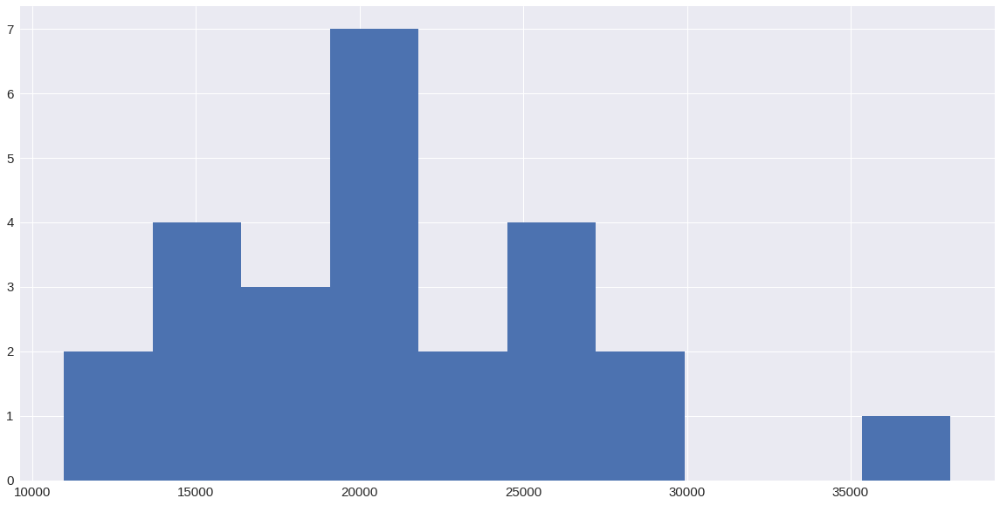

In [11]:
q = np.quantile(df['Total'], [0.2, 0.4, 0.6, 0.8])
df['Total'].hist()

In [12]:
df['Total_level'] = 0
df.loc[df['Total']<=q[0],'Total_level'] = 'A'
df.loc[(df['Total']>q[0])&(df['Total']<=q[1]),'Total_level'] = 'B'
df.loc[(df['Total']>q[1])&(df['Total']<=q[2]),'Total_level'] = 'C'
df.loc[(df['Total']>q[2])&(df['Total']<=q[3]),'Total_level'] = 'D'
df.loc[df['Total']>q[3],'Total_level'] = 'E'

## 3.2. 살인 관련 

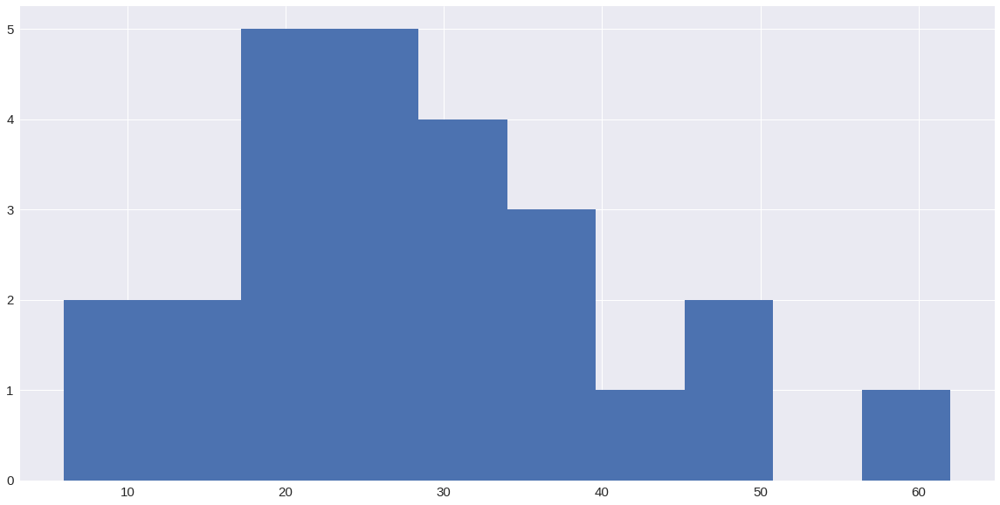

In [13]:
q = np.quantile(df['Murder'], [0.2, 0.4, 0.6, 0.8])
df['Murder'].hist()

In [14]:
df['Murder_level'] = 0
df.loc[df['Murder']<=q[0],'Murder_level'] = 'A'
df.loc[(df['Murder']>q[0])&(df['Murder']<=q[1]),'Murder_level'] = 'B'
df.loc[(df['Murder']>q[1])&(df['Murder']<=q[2]),'Murder_level'] = 'C'
df.loc[(df['Murder']>q[2])&(df['Murder']<=q[3]),'Murder_level'] = 'D'
df.loc[df['Murder']>q[3],'Murder_level'] = 'E'

## 3.3. 강도 관련

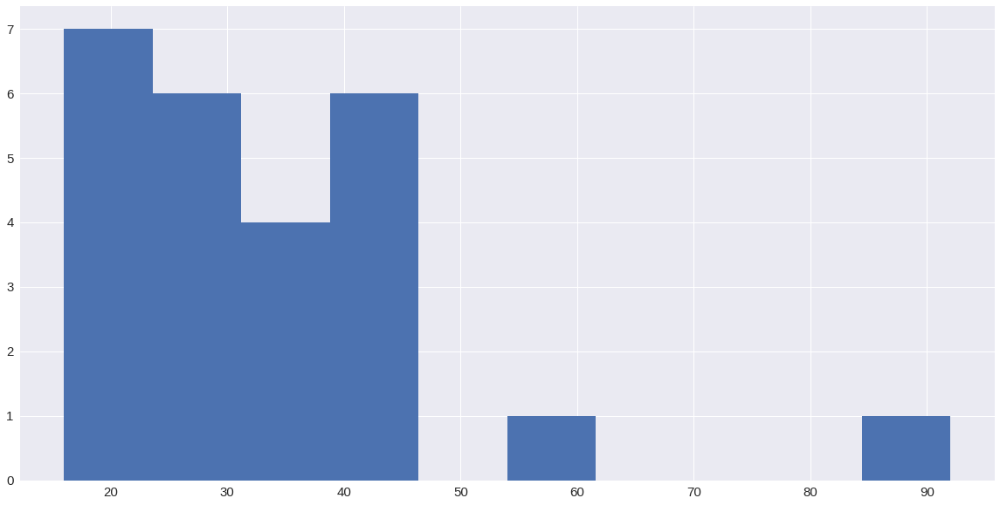

In [15]:
q = np.quantile(df['Robbery'], [0.2, 0.4, 0.6, 0.8])
df['Robbery'].hist()

In [16]:
df['Robbery_level'] = 0
df.loc[df['Robbery']<=q[0],'Robbery_level'] = 'A'
df.loc[(df['Robbery']>q[0])&(df['Robbery']<=q[1]),'Robbery_level'] = 'B'
df.loc[(df['Robbery']>q[1])&(df['Robbery']<=q[2]),'Robbery_level'] = 'C'
df.loc[(df['Robbery']>q[2])&(df['Robbery']<=q[3]),'Robbery_level'] = 'D'
df.loc[df['Robbery']>q[3],'Robbery_level'] = 'E'

## 3.4. 강간 관련

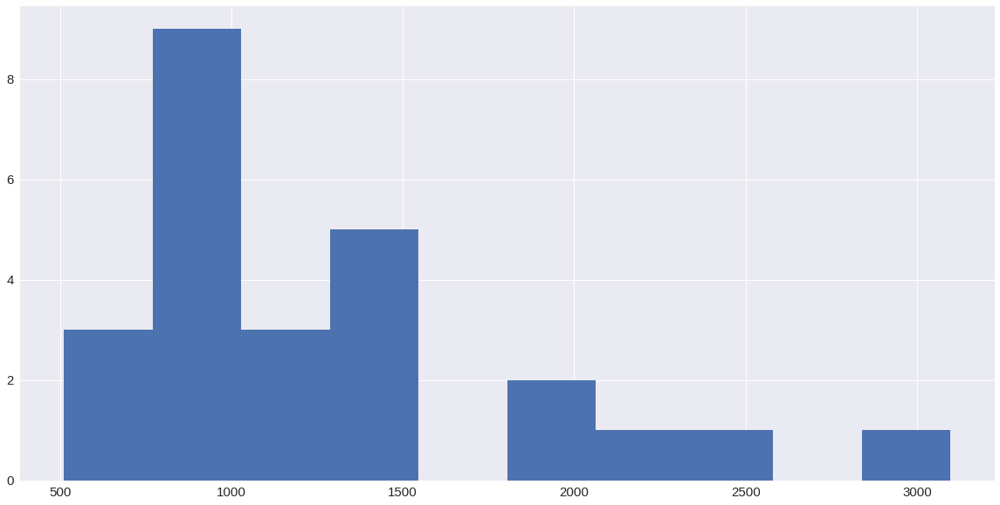

In [17]:
q = np.quantile(df['Rape'], [0.2, 0.4, 0.6, 0.8])
df['Rape'].hist()

In [18]:
df['Rape_level'] = 0
df.loc[df['Rape']<=q[0],'Rape_level'] = 'A'
df.loc[(df['Rape']>q[0])&(df['Rape']<=q[1]),'Rape_level'] = 'B'
df.loc[(df['Rape']>q[1])&(df['Rape']<=q[2]),'Rape_level'] = 'C'
df.loc[(df['Rape']>q[2])&(df['Rape']<=q[3]),'Rape_level'] = 'D'
df.loc[df['Rape']>q[3],'Rape_level'] = 'E'

## 3.5. 절도 관련

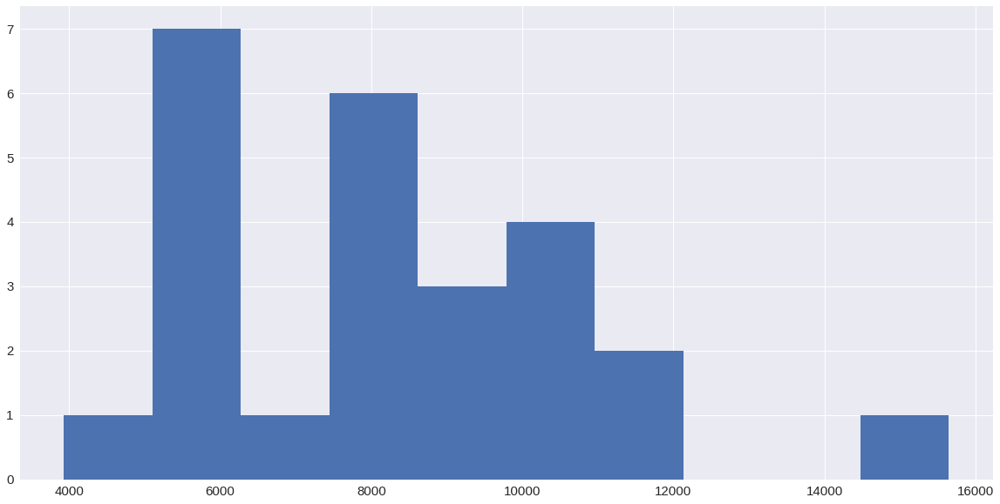

In [19]:
q = np.quantile(df['Theft'], [0.2, 0.4, 0.6, 0.8])
df['Theft'].hist()

In [20]:
df['Theft_level'] = 0
df.loc[df['Theft']<=q[0],'Theft_level'] = 'A'
df.loc[(df['Theft']>q[0])&(df['Theft']<=q[1]),'Theft_level'] = 'B'
df.loc[(df['Theft']>q[1])&(df['Theft']<=q[2]),'Theft_level'] = 'C'
df.loc[(df['Theft']>q[2])&(df['Theft']<=q[3]),'Theft_level'] = 'D'
df.loc[df['Theft']>q[3],'Theft_level'] = 'E'

## 3.6. 폭행 관련

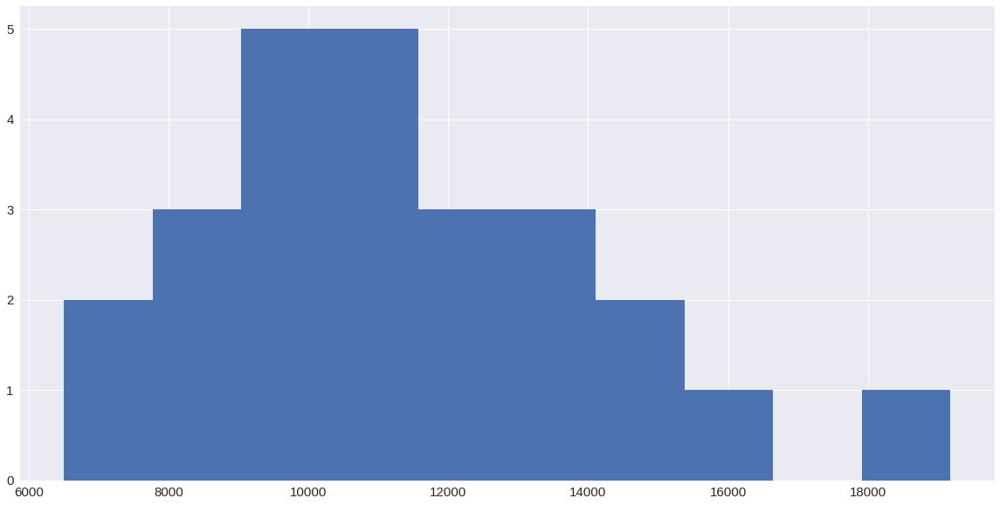

In [21]:
q = np.quantile(df['Violence'], [0.2, 0.4, 0.6, 0.8])
df['Violence'].hist()

In [22]:
df['Violence_level'] = 0
df.loc[df['Violence']<=q[0],'Violence_level'] = 'A'
df.loc[(df['Violence']>q[0])&(df['Violence']<=q[1]),'Violence_level'] = 'B'
df.loc[(df['Violence']>q[1])&(df['Violence']<=q[2]),'Violence_level'] = 'C'
df.loc[(df['Violence']>q[2])&(df['Violence']<=q[3]),'Violence_level'] = 'D'
df.loc[df['Violence']>q[3],'Violence_level'] = 'E'

## 3.7. 최종 레이블 데이터 확인

In [23]:
df

,GU,Total,Murder,Robbery,Rape,Theft,Violence,Total_level,Murder_level,Robbery_level,Rape_level,Theft_level,Violence_level
0,종로,19154,32,39,1157,7765,10161,B,D,D,C,C,B
1,중,20536,10,39,1053,9695,9739,C,A,D,C,D,B
2,용산,17890,14,26,1411,6041,10398,B,A,B,D,A,C
3,성동,13124,18,23,610,5353,7120,A,A,A,A,A,A
4,광진,21495,23,36,1297,10164,9975,D,B,D,D,D,B
5,동대문,19535,34,34,829,7905,10733,C,D,C,A,C,C
6,중랑,21894,37,29,831,7922,13075,D,D,C,B,C,D
7,성북,15664,25,23,828,6048,8740,A,C,A,A,B,A
8,강북,17667,38,27,948,5357,11297,B,E,C,C,A,C
9,도봉,10975,6,20,512,3931,6506,A,A,A,A,A,A


# 4. Prepare image file path & Merge dataframes

## 4.1. Prepare image file path

- df의 구 이름은 한글 이름만 있으므로 {한글 구 이름 : 영어 구 이름} 형식의 사전을 통해 한글 이름과 영어 이름을 mapping한다.
- pathlib을 이용하여 이미지 파일의 경로를 가져온다. 이때 파일 명은 구 이름이므로 split()하여 해당 사진이 어느 구인지 또한 불러온다. 이 둘을 file_path라는 데이터프레임으로 만든다. 

In [24]:
seoul = {'강남':'Gangnam','강동':'Gangdong','강북':'Gangbuk','강서':'Gangseo',
        '관악':'Gwanak','광진':'Gwangjin','구로':'Guro','금천':'Geumcheon',
        '노원':'Nowon','도봉':'Dobong','동대문':'Dongdaemun','동작':'Dongjak',
        '마포':'Mapo','서대문':'Seodaemun','서초':'Seocho','성동':'Seongdong',
        '성북':'Seongbuk','송파':'Songpa','양천':'Yangcheon','영등포':'Yeongdeungpo',
        '은평':'Eunpyeong', '종로':'Jongno','중':'Jung','중랑':'Jungnang',
        '용산':'Yongsan'}

In [25]:
df['GU_eng'] = df['GU'].map(seoul)
df.head()

,GU,Total,Murder,Robbery,Rape,Theft,Violence,Total_level,Murder_level,Robbery_level,Rape_level,Theft_level,Violence_level,GU_eng
0,종로,19154,32,39,1157,7765,10161,B,D,D,C,C,B,Jongno
1,중,20536,10,39,1053,9695,9739,C,A,D,C,D,B,Jung
2,용산,17890,14,26,1411,6041,10398,B,A,B,D,A,C,Yongsan
3,성동,13124,18,23,610,5353,7120,A,A,A,A,A,A,Seongdong
4,광진,21495,23,36,1297,10164,9975,D,B,D,D,D,B,Gwangjin


In [26]:
from pathlib import Path

base_path = Path('/content/cropped_img_data/cropped_img_data')
path_list = []

for folder in base_path.iterdir() :    
    for file in folder.iterdir() :
        path_list.append([file,file.stem.split('_')[0]])

file_path = pd.DataFrame(path_list, columns=['Path','GU'])
file_path.head()

,Path,GU
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,Mapo
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,Mapo
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,Mapo
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,Mapo
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,Mapo


## 4.2. Merge Dataframes

- df에서 merge할 때 들어갈 column들만 뽑아낸다. 
- 파일 경로가 들어있는 file_path와 범죄 등급이 들어있는 df를 merge하여 crime_df라는 새로운 데이터프레임을 만든다. 

In [27]:
df = df[['GU_eng','Total_level','Murder_level','Robbery_level','Rape_level','Theft_level','Violence_level']]
df.head(3)

,GU_eng,Total_level,Murder_level,Robbery_level,Rape_level,Theft_level,Violence_level
0,Jongno,B,D,D,C,C,B
1,Jung,C,A,D,C,D,B
2,Yongsan,B,A,B,D,A,C


In [28]:
crime_df = file_path.merge(df, how='left', left_on='GU', right_on='GU_eng')
crime_df.drop('GU_eng', axis=1, inplace=True)
crime_df.head()

,Path,GU,Total_level,Murder_level,Robbery_level,Rape_level,Theft_level,Violence_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,Mapo,E,C,B,E,E,D
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,Mapo,E,C,B,E,E,D
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,Mapo,E,C,B,E,E,D
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,Mapo,E,C,B,E,E,D
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,Mapo,E,C,B,E,E,D


# 5. Prepare data for CNN

In [29]:
# data block settings

my_random_seed = 42
my_batch_size = 64

In [30]:
from fastai.vision.data import ImageDataLoaders

## 5.1. 5대 범죄 발생 합계 관련




In [31]:
total_df = crime_df[['Path','Total_level']]
total_df.head()

,Path,Total_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,E
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,E
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,E
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,E
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,E


In [32]:
dls_total = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('Total_level'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(total_df)

In [33]:
len(dls_total.train_ds), len(dls_total.valid_ds)

(2131, 532)

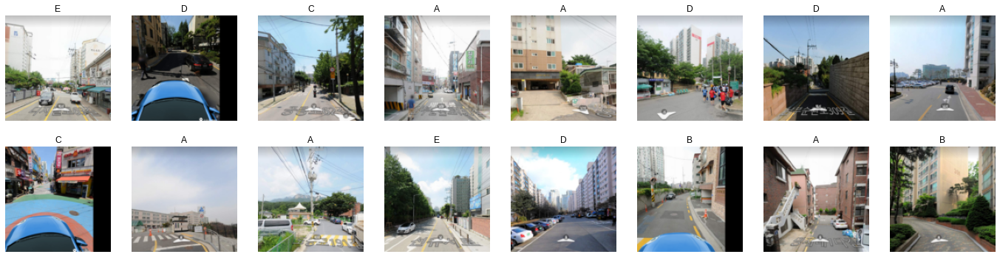

In [34]:
# show image examples

dls_total.show_batch(max_n=16, nrows=2)

## 5.2. 살인 관련

In [35]:
murder_df = crime_df[['Path','Murder_level']]
murder_df.head()

,Path,Murder_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,C
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,C
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,C
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,C
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,C


In [36]:
dls_murder = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('Murder_level'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(murder_df)

In [37]:
len(dls_murder.train_ds), len(dls_murder.valid_ds)

(2131, 532)

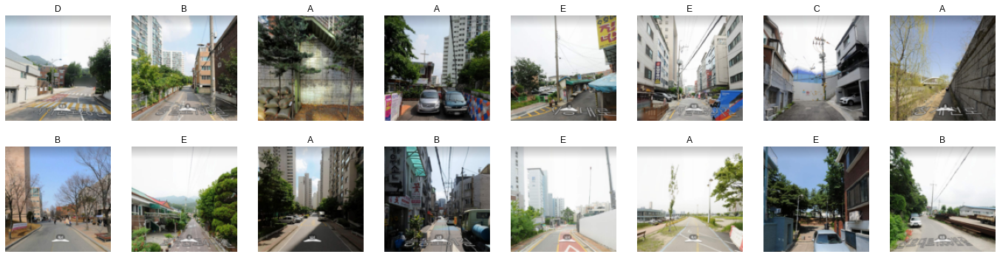

In [38]:
# show image examples

dls_murder.show_batch(max_n=16, nrows=2)

## 5.3. 강도 관련

In [39]:
robbery_df = crime_df[['Path','Robbery_level']]
robbery_df.head()

,Path,Robbery_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,B
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,B
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,B
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,B
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,B


In [40]:
dls_robbery = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('Robbery_level'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(robbery_df)

In [41]:
len(dls_robbery.train_ds), len(dls_robbery.valid_ds)

(2131, 532)

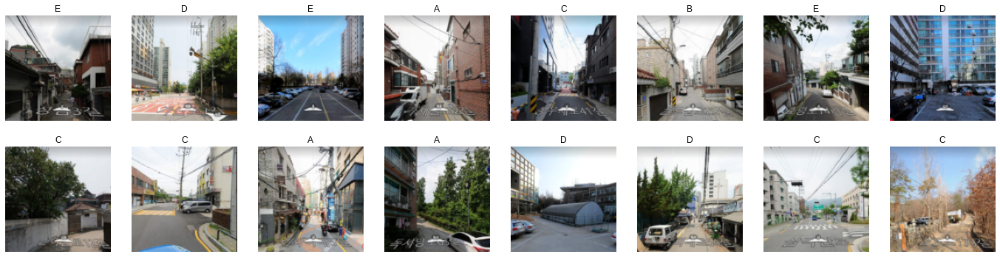

In [42]:
# show image examples

dls_robbery.show_batch(max_n=16, nrows=2)

## 5.4. 강간 관련

In [43]:
rape_df = crime_df[['Path','Rape_level']]
rape_df.head()

,Path,Rape_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,E
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,E
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,E
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,E
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,E


In [44]:
dls_rape = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('Rape_level'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(rape_df)

In [45]:
len(dls_rape.train_ds), len(dls_rape.valid_ds)

(2131, 532)

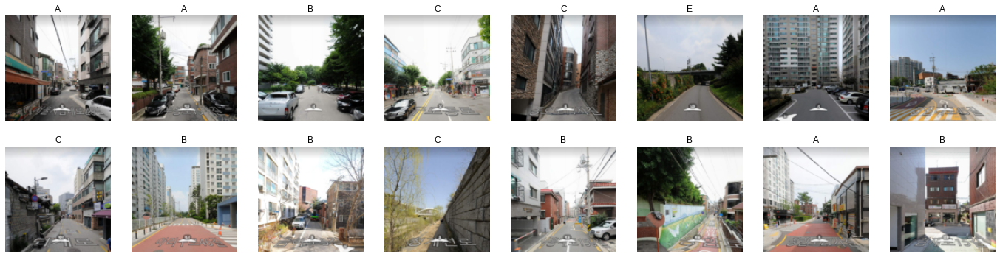

In [46]:
# show image examples

dls_rape.show_batch(max_n=16, nrows=2)

## 5.5. 절도 관련

In [47]:
theft_df = crime_df[['Path','Theft_level']]
theft_df.head()

,Path,Theft_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,E
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,E
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,E
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,E
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,E


In [48]:
dls_theft = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('Theft_level'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(theft_df)

In [49]:
len(dls_theft.train_ds), len(dls_theft.valid_ds)

(2131, 532)

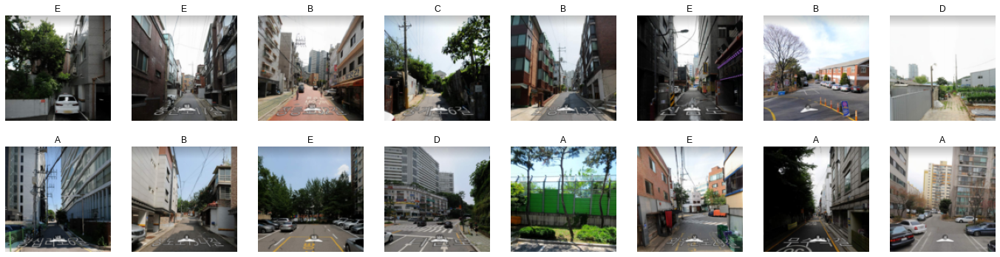

In [50]:
# show image examples

dls_theft.show_batch(max_n=16, nrows=2)

## 5.6. 폭행 관련

In [51]:
violence_df = crime_df[['Path','Violence_level']]
violence_df.head()

,Path,Violence_level
0,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_11.png,D
1,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_42.png,D
2,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_72.png,D
3,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_77.png,D
4,/content/cropped_img_data/cropped_img_data/Mapo/Mapo_crop_4.png,D


In [52]:
dls_violence = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('Violence_level'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(violence_df)

In [53]:
len(dls_violence.train_ds), len(dls_violence.valid_ds)

(2131, 532)

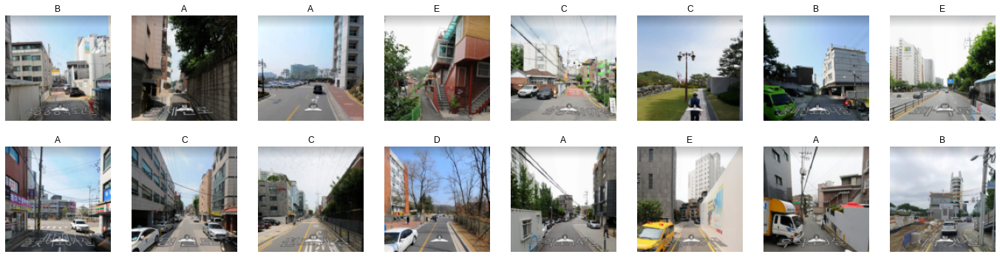

In [54]:
# show image examples

dls_violence.show_batch(max_n=16, nrows=2)

# 6. Train CNN Model

## 6.1. 5대 범죄 발생 합계 관련

- base line : 565/2663 = 21.2% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
- resnet18 : epoch 1에서 early stop했을 때, accuracy가 0.253759
- resnet50 : epoch 4에서 early stop했을 때, accuracy가 0.259398
- 결론
  - resnet18, resnet50 모두 베이스라인인 0.212에서 크게 벗어나지 않았다는 것을 확인할 수 있다. 
  - resnet 레이어 개수는 accuracy에 큰 영향을 안준다는 것을 확인할 수 있다.
  - confusion matrix를 보면 하나의 Actual값에 대해 특정 값을 predict하지 않는 다는 것을 알 수 있다. (대부분 0.2에서 수렴하는 것으로 확인할 수 있다.)
  - 위 근거들을 토대로 로드맵 사진으로 5대 범죄의 총 등급을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 

In [ ]:
# A~E 레이블 개수 확인하기 위해 groupby() 이용
crime_df.groupby(crime_df['Total_level']).size()

Total_level
A    545
B    502
C    565
D    543
E    508
dtype: int64

### 6.1.1. Resnet18

In [ ]:
learn_total = cnn_learner(dls_total, resnet18, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_total.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,accuracy,time
0,2.724597,2.109169,0.229323,00:49


Better model found at epoch 0 with accuracy value: 0.22932331264019012.


epoch,train_loss,valid_loss,accuracy,time
0,2.093675,1.955470,0.248120,00:50
1,1.804412,1.916811,0.253759,00:50
2,1.585837,1.960283,0.234962,00:48
3,1.330207,2.022323,0.250000,00:48
4,1.076257,2.091792,0.236842,00:48
5,0.863308,2.199441,0.248120,00:51
6,0.650244,2.376595,0.236842,00:47


Better model found at epoch 0 with accuracy value: 0.24812030792236328.
Better model found at epoch 1 with accuracy value: 0.25375938415527344.
No improvement since epoch 1: early stopping


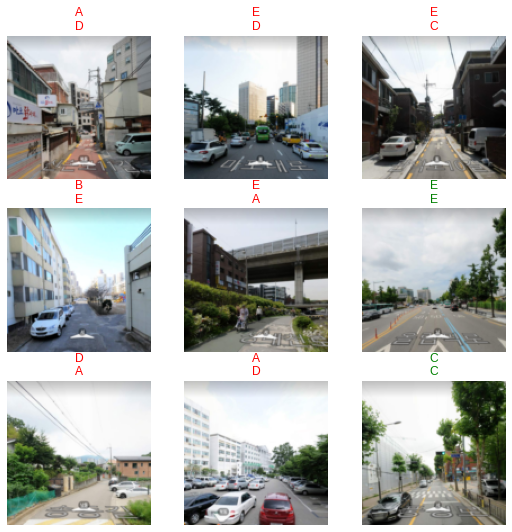

In [ ]:
learn_total.show_results()

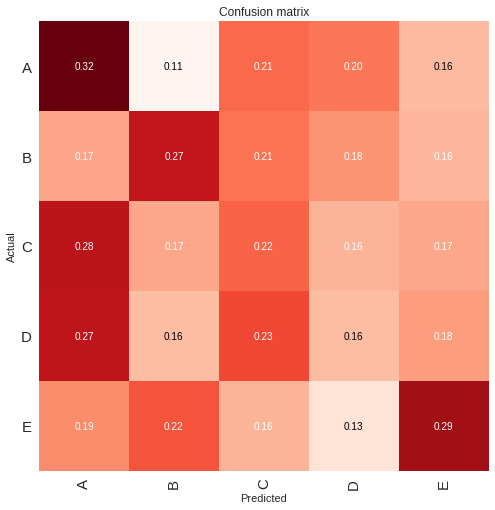

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_total)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

### 6.1.2. Resnet50

In [ ]:
learn_total_50 = cnn_learner(dls_total, resnet50, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_total_50.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,accuracy,time
0,2.931315,2.918397,0.203008,00:50


Better model found at epoch 0 with accuracy value: 0.2030075192451477.


epoch,train_loss,valid_loss,accuracy,time
0,1.904934,2.235192,0.244361,00:51
1,1.366936,2.142064,0.248120,00:51
2,0.960712,2.322558,0.234962,00:51
3,0.650055,2.565802,0.246241,00:51
4,0.423353,2.837717,0.259398,00:54
5,0.275478,3.171653,0.236842,00:51
6,0.181278,3.357681,0.238722,00:51
7,0.126626,3.544065,0.253759,00:50
8,0.093798,4.024382,0.221805,00:51
9,0.093113,4.631866,0.233083,00:50


Better model found at epoch 0 with accuracy value: 0.24436090886592865.
Better model found at epoch 1 with accuracy value: 0.24812030792236328.
Better model found at epoch 4 with accuracy value: 0.259398490190506.
No improvement since epoch 4: early stopping


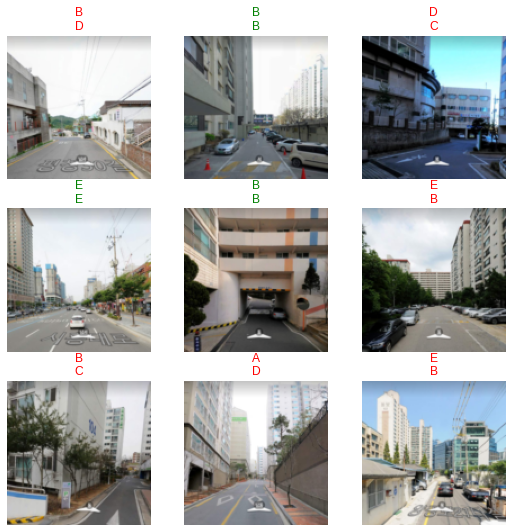

In [ ]:
learn_total_50.show_results()

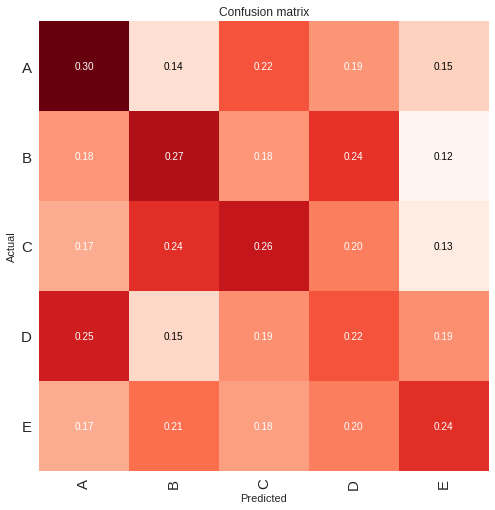

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_total_50)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

## 6.2. 살인 관련

- base line : 549/2663 = 20.6% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
- resnet18 : epoch 4에서 early stop했을 때, accuracy가 0.265038
- resnet50 : epoch 6에서 early stop했을 때, accuracy가 0.255639
- 결론
  - resnet18, resnet50 모두 베이스라인인 0.206에서 크게 벗어나지 않았다는 것을 확인할 수 있다. 
  - resnet 레이어 개수는 accuracy에 큰 영향을 안준다는 것을 확인할 수 있다.
  - confusion matrix를 보면 하나의 Actual값에 대해 특정 값을 predict하지 않는 다는 것을 알 수 있다. (대부분 0.2에서 수렴하는 것으로 확인할 수 있다.)
  - 위 근거들을 토대로 로드맵 사진으로 살인 범죄 등급을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 

In [ ]:
# A~E 레이블 개수 확인하기 위해 groupby() 이용
crime_df.groupby(crime_df['Murder_level']).size()

Murder_level
A    549
B    525
C    519
D    543
E    527
dtype: int64

### 6.2.1. Resnet18

In [55]:
learn_murder = cnn_learner(dls_murder, resnet18, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_murder.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,accuracy,time
0,2.712466,2.134964,0.216165,01:04


Better model found at epoch 0 with accuracy value: 0.21616540849208832.


epoch,train_loss,valid_loss,accuracy,time
0,2.091449,2.018329,0.195489,00:54
1,1.853822,1.982272,0.231203,00:50
2,1.617968,2.002486,0.240602,00:52
3,1.382448,2.051697,0.242481,00:53
4,1.126894,2.116149,0.265038,00:52
5,0.877988,2.281416,0.251880,00:51
6,0.654074,2.497202,0.234962,00:48
7,0.453171,2.665003,0.244361,00:49
8,0.305714,2.956762,0.225564,00:57
9,0.204123,3.109582,0.225564,00:56


Better model found at epoch 0 with accuracy value: 0.19548872113227844.
Better model found at epoch 1 with accuracy value: 0.23120300471782684.
Better model found at epoch 2 with accuracy value: 0.24060150980949402.
Better model found at epoch 3 with accuracy value: 0.24248120188713074.
Better model found at epoch 4 with accuracy value: 0.2650375962257385.
No improvement since epoch 4: early stopping


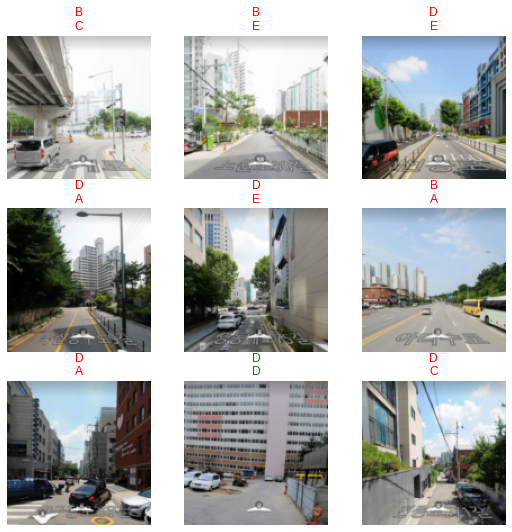

In [56]:
learn_murder.show_results()

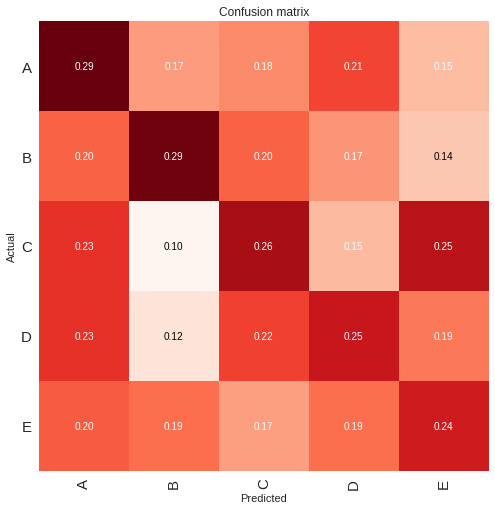

In [57]:
interp = ClassificationInterpretation.from_learner(learn_murder)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

### 6.2.2. Resnet50

In [ ]:
learn_murder_50 = cnn_learner(dls_murder, resnet50, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_murder_50.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.942397,2.895545,0.206767,00:51


Better model found at epoch 0 with accuracy value: 0.20676691830158234.


epoch,train_loss,valid_loss,accuracy,time
0,1.843785,2.278984,0.218045,00:53
1,1.319263,2.206241,0.208647,00:53
2,0.919706,2.335628,0.233083,00:53
3,0.633555,2.496552,0.229323,00:53
4,0.406329,2.821622,0.238722,00:53
5,0.262158,3.098299,0.244361,00:52
6,0.167551,3.308742,0.255639,00:52
7,0.114249,3.540101,0.251880,00:52
8,0.092345,3.917732,0.251880,00:53
9,0.133318,4.524855,0.227444,00:53


Better model found at epoch 0 with accuracy value: 0.21804511547088623.
Better model found at epoch 2 with accuracy value: 0.23308271169662476.
Better model found at epoch 4 with accuracy value: 0.2387218028306961.
Better model found at epoch 5 with accuracy value: 0.24436090886592865.
Better model found at epoch 6 with accuracy value: 0.25563910603523254.
No improvement since epoch 6: early stopping


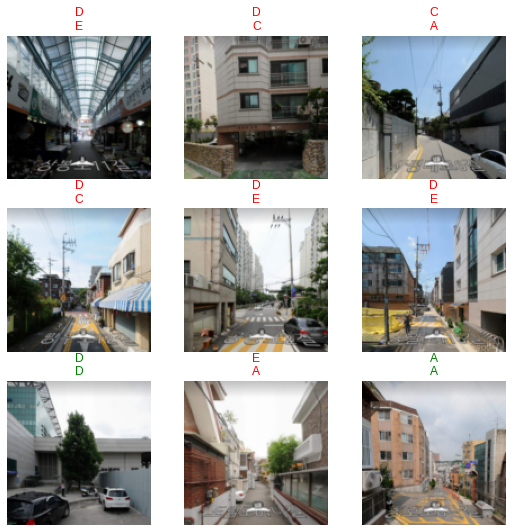

In [ ]:
learn_murder_50.show_results()

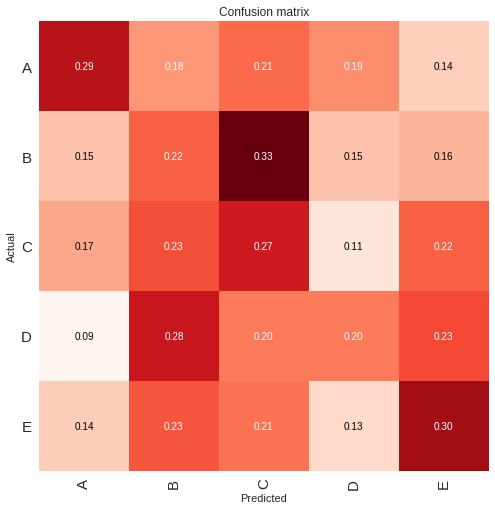

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_murder_50)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

## 6.3. 강도 관련

- base line : 738/2663 = 27.7% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
  - 이 경우 A와 B의 레이블 수 차이가 많이 나므로 accuracy와 f1score를 함께 살펴본다. 
- resnet18 : epoch 12에서 early stop했을 때, f1score가 0.269466, accuracy가 0.285714
- resnet50 : epoch 10에서 early stop했을 때, f1score가 0.304598, accuracy가 0.323308
- 결론
  - resnet18, resnet50 모두 베이스라인인 0.277에서 크게 벗어나지 않았다는 것을 확인할 수 있다. 
  - resnet 레이어 개수는 accuracy에 큰 영향을 안준다는 것을 확인할 수 있다.
  - confusion matrix를 보면 하나의 Actual값에 대해 특정 값을 predict하지 않는 다는 것을 알 수 있다. (대부분 0.2에서 수렴하는 것으로 확인할 수 있다.) 특히 B같은 경우 레이블의 개수가 가장 적은 만큼, B로는 예측 자체도 거의 안한 것을 확인할 수 있다. 
  - 위 근거들을 토대로 로드맵 사진으로 강도 범죄 등급을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 

In [ ]:
# A~E 레이블 개수 확인하기 위해 groupby() 이용
crime_df.groupby(crime_df['Robbery_level']).size()

Robbery_level
A    738
B    300
C    562
D    548
E    515
dtype: int64

### 6.3.1. Resnet18

In [ ]:
f1_score_multi = F1Score(average="macro")
learn_robbery = cnn_learner(dls_robbery, resnet18, metrics=[f1_score_multi,accuracy]).to_fp16() # resnet 18, 34, 50, 101, 152
learn_robbery.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='f1_score', patience=5),SaveModelCallback(monitor='f1_score')])

epoch,train_loss,valid_loss,f1_score,accuracy,time
0,2.707616,2.091159,0.212739,0.227444,00:46


Better model found at epoch 0 with f1_score value: 0.21273879151789363.


epoch,train_loss,valid_loss,f1_score,accuracy,time
0,2.054542,2.007085,0.221375,0.238722,00:46
1,1.754284,1.996298,0.220288,0.244361,00:49
2,1.499812,1.998329,0.225810,0.244361,00:49
3,1.259293,2.091225,0.233315,0.255639,00:46
4,1.027347,2.125355,0.233470,0.248120,00:47
5,0.812417,2.314622,0.233911,0.242481,00:47
6,0.604640,2.478879,0.250346,0.263158,00:48
7,0.412376,2.747325,0.239958,0.251880,00:48
8,0.277367,2.941730,0.239877,0.250000,00:48
9,0.191444,3.169604,0.247866,0.259398,00:48


Better model found at epoch 0 with f1_score value: 0.22137504768505942.
Better model found at epoch 2 with f1_score value: 0.2258095600303987.
Better model found at epoch 3 with f1_score value: 0.23331529011966023.
Better model found at epoch 4 with f1_score value: 0.23346990669549172.
Better model found at epoch 5 with f1_score value: 0.23391080554932192.
Better model found at epoch 6 with f1_score value: 0.25034618015794485.
Better model found at epoch 10 with f1_score value: 0.26049982523830956.
Better model found at epoch 12 with f1_score value: 0.26946593946593944.
No improvement since epoch 12: early stopping


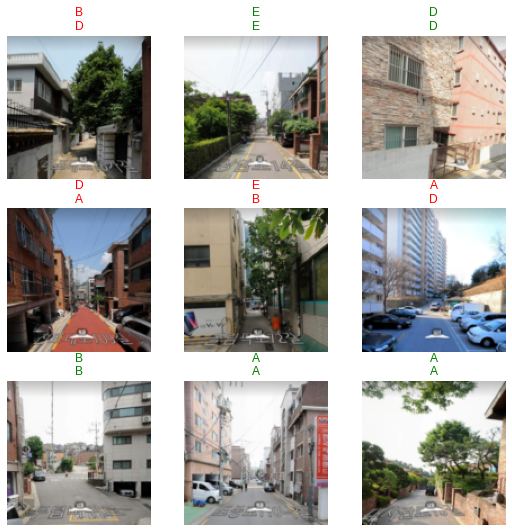

In [ ]:
learn_robbery.show_results()

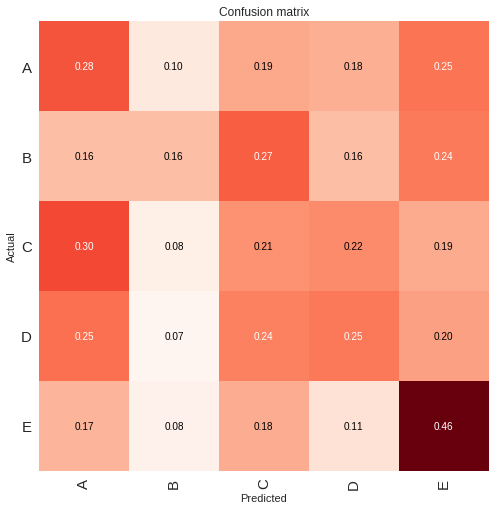

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_robbery)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

### 6.3.2. Resnet50

In [ ]:
f1_score_multi = F1Score(average="macro")
learn_robbery_50 = cnn_learner(dls_robbery, resnet50, metrics=[f1_score_multi,accuracy]).to_fp16() # resnet 18, 34, 50, 101, 152
learn_robbery_50.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='f1_score', patience=5),SaveModelCallback(monitor='f1_score')])

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,f1_score,accuracy,time
0,2.882366,2.912260,0.243323,0.257519,01:04


Better model found at epoch 0 with f1_score value: 0.24332332902348477.


epoch,train_loss,valid_loss,f1_score,accuracy,time
0,1.835977,2.084425,0.253084,0.268797,00:55
1,1.295531,2.022183,0.255519,0.281955,00:55
2,0.919522,2.195982,0.229773,0.251880,00:55
3,0.629663,2.438672,0.250065,0.278196,00:55
4,0.396974,2.653822,0.269835,0.295113,00:57
5,0.254664,2.988158,0.261319,0.285714,00:56
6,0.164047,3.123325,0.262617,0.289474,00:56
7,0.113718,3.335332,0.269384,0.296992,00:56
8,0.090974,3.587661,0.279947,0.302632,00:55
9,0.113039,4.200928,0.262282,0.289474,00:54


Better model found at epoch 0 with f1_score value: 0.2530842981516836.
Better model found at epoch 1 with f1_score value: 0.25551878090547636.
Better model found at epoch 4 with f1_score value: 0.26983544859033753.
Better model found at epoch 8 with f1_score value: 0.2799465511669585.
Better model found at epoch 10 with f1_score value: 0.3045979603764198.
No improvement since epoch 10: early stopping


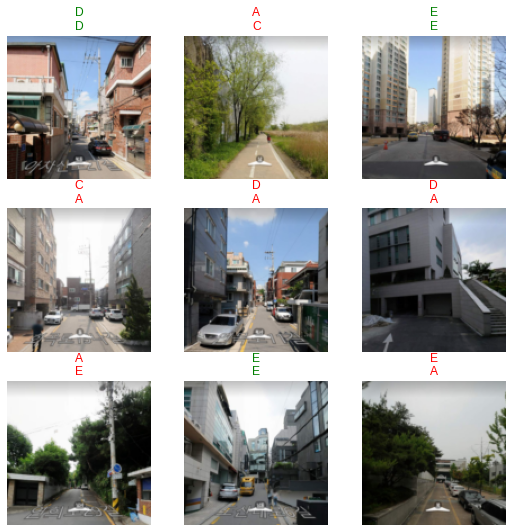

In [ ]:
learn_robbery_50.show_results()

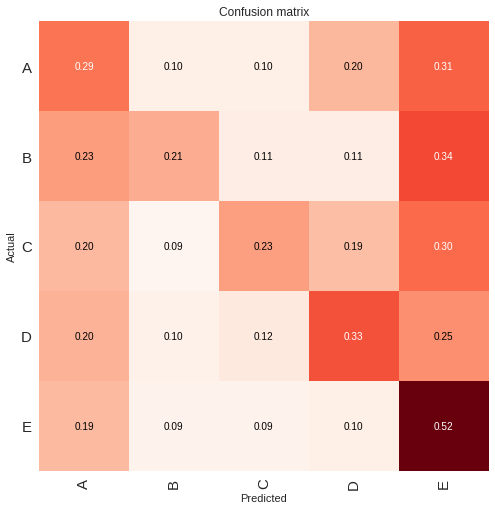

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_robbery_50)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

## 6.4. 강간 관련

- base line : 563/2663 = 21.1% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
- resnet18 : epoch 15에서 early stop했을 때, accuracy가 0.253759
- resnet50 : epoch 0에서 early stop했을 때, accuracy가 0.248120
- 결론
  - resnet18, resnet50 모두 베이스라인인 0.211에서 크게 벗어나지 않았다는 것을 확인할 수 있다. 
  - resnet 레이어 개수는 accuracy에 큰 영향을 안준다는 것을 확인할 수 있다.
  - confusion matrix를 보면 하나의 Actual값에 대해 특정 값을 predict하지 않는 다는 것을 알 수 있다. (대부분 0.2에서 수렴하는 것으로 확인할 수 있다.)
  - 위 근거들을 토대로 로드맵 사진으로 강간 범죄 등급을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 

In [ ]:
# A~E 레이블 개수 확인하기 위해 groupby() 이용
crime_df.groupby(crime_df['Rape_level']).size()

Rape_level
A    543
B    544
C    563
D    505
E    508
dtype: int64

### 6.4.1. Resnet18

In [ ]:
learn_rape = cnn_learner(dls_rape, resnet18, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_rape.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.635914,2.127240,0.208647,00:49


Better model found at epoch 0 with accuracy value: 0.20864661037921906.


epoch,train_loss,valid_loss,accuracy,time
0,2.045876,2.006466,0.210526,00:49
1,1.774893,1.989456,0.216165,00:48
2,1.552707,2.000867,0.221805,00:48
3,1.304448,2.074555,0.208647,00:48
4,1.088727,2.161960,0.212406,00:48
5,0.859210,2.308384,0.203008,00:48
6,0.644239,2.499785,0.227444,00:49
7,0.448027,2.695490,0.238722,00:48
8,0.293574,2.937373,0.218045,00:49
9,0.194939,3.200484,0.223684,00:49


Better model found at epoch 0 with accuracy value: 0.21052631735801697.
Better model found at epoch 1 with accuracy value: 0.21616540849208832.
Better model found at epoch 2 with accuracy value: 0.22180451452732086.
Better model found at epoch 6 with accuracy value: 0.2274436056613922.
Better model found at epoch 7 with accuracy value: 0.2387218028306961.
Better model found at epoch 11 with accuracy value: 0.24624060094356537.
Better model found at epoch 14 with accuracy value: 0.25.
Better model found at epoch 15 with accuracy value: 0.25375938415527344.
No improvement since epoch 15: early stopping


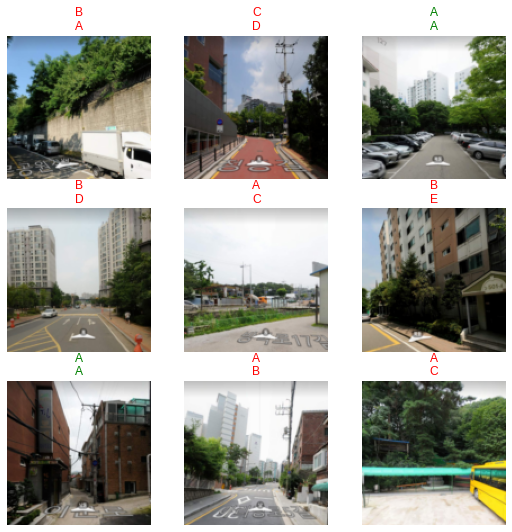

In [ ]:
learn_rape.show_results()

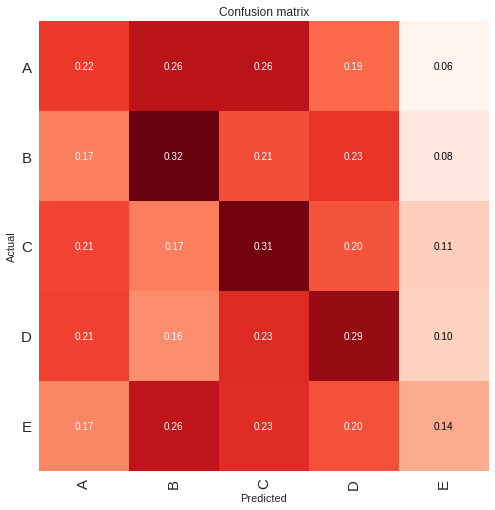

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_rape)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

### 6.4.2. Resnet50

In [ ]:
learn_rape_50 = cnn_learner(dls_rape, resnet50, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_rape_50.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.885067,2.861796,0.229323,00:52


Better model found at epoch 0 with accuracy value: 0.22932331264019012.


epoch,train_loss,valid_loss,accuracy,time
0,1.865755,2.150407,0.248120,00:53
1,1.324301,2.137459,0.244361,00:54
2,0.958065,2.243451,0.231203,00:52
3,0.644579,2.405271,0.240602,00:53
4,0.411998,2.717990,0.233083,00:53
5,0.259859,2.959251,0.242481,00:53


Better model found at epoch 0 with accuracy value: 0.24812030792236328.
No improvement since epoch 0: early stopping


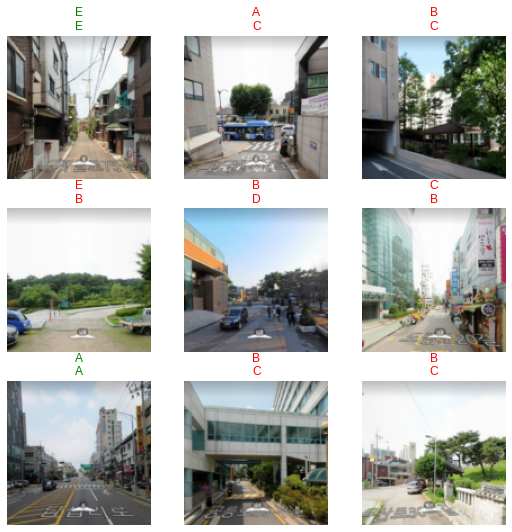

In [ ]:
learn_rape_50.show_results()

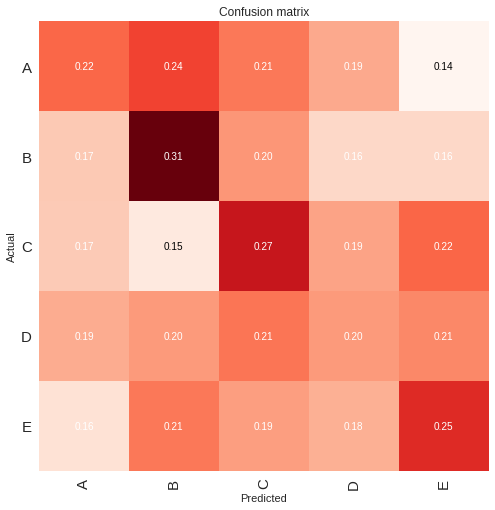

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_rape_50)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

## 6.5. 절도 관련

- base line : 566/2663 = 21.3% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
- resnet18 : epoch 17에서 early stop했을 때, accuracy가 0.268797
- resnet50 : epoch 17에서 early stop했을 때, accuracy가 0.278196
- 결론
  - resnet18, resnet50 모두 베이스라인인 0.213에서 크게 벗어나지 않았다는 것을 확인할 수 있다. 
  - resnet 레이어 개수는 accuracy에 큰 영향을 안준다는 것을 확인할 수 있다.
  - confusion matrix를 보면 하나의 Actual값에 대해 특정 값을 predict하지 않는 다는 것을 알 수 있다. (대부분 0.2에서 수렴하는 것으로 확인할 수 있다.) 
  - 위 근거들을 토대로 로드맵 사진으로 절도 범죄 등급을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 

In [ ]:
# A~E 레이블 개수 확인하기 위해 groupby() 이용
crime_df.groupby(crime_df['Theft_level']).size()

Theft_level
A    520
B    527
C    542
D    566
E    508
dtype: int64

### 6.5.1. Resnet18

In [ ]:
learn_theft = cnn_learner(dls_theft, resnet18, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_theft.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.661748,2.085187,0.234962,00:50


Better model found at epoch 0 with accuracy value: 0.23496240377426147.


epoch,train_loss,valid_loss,accuracy,time
0,2.118079,2.017666,0.208647,00:49
1,1.818811,1.976997,0.218045,00:47
2,1.562764,2.004691,0.216165,00:46
3,1.331344,2.054009,0.219925,00:48
4,1.110428,2.153200,0.233083,00:47
5,0.880723,2.274351,0.227444,00:48
6,0.664268,2.470915,0.244361,00:48
7,0.471520,2.734695,0.242481,00:48
8,0.327226,2.911284,0.257519,00:49
9,0.211862,3.002189,0.255639,00:48


Better model found at epoch 0 with accuracy value: 0.20864661037921906.
Better model found at epoch 1 with accuracy value: 0.21804511547088623.
Better model found at epoch 3 with accuracy value: 0.21992480754852295.
Better model found at epoch 4 with accuracy value: 0.23308271169662476.
Better model found at epoch 6 with accuracy value: 0.24436090886592865.
Better model found at epoch 8 with accuracy value: 0.25751879811286926.
Better model found at epoch 10 with accuracy value: 0.259398490190506.
Better model found at epoch 13 with accuracy value: 0.2631579041481018.
Better model found at epoch 17 with accuracy value: 0.26879698038101196.
No improvement since epoch 17: early stopping


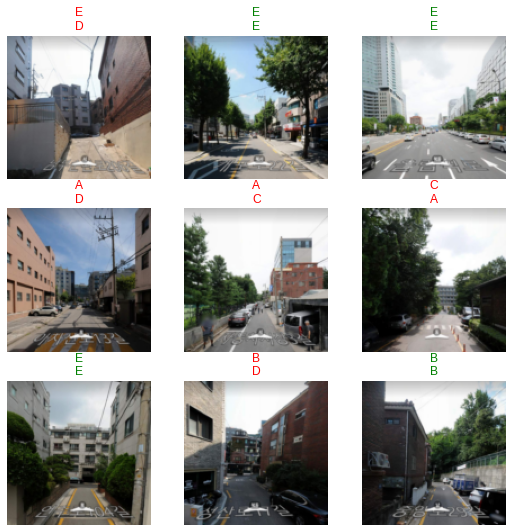

In [ ]:
learn_theft.show_results()

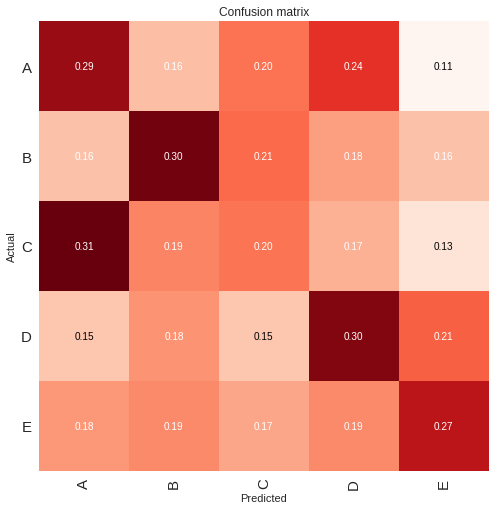

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_theft)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

### 6.5.2. Resnet50

In [ ]:
learn_theft_50 = cnn_learner(dls_theft, resnet50, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_theft_50.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.805994,2.806985,0.221805,00:47


Better model found at epoch 0 with accuracy value: 0.22180451452732086.


epoch,train_loss,valid_loss,accuracy,time
0,1.827348,2.169675,0.218045,00:50
1,1.286826,2.134364,0.214286,00:50
2,0.922346,2.257648,0.214286,00:50
3,0.621824,2.534598,0.221805,00:50
4,0.394540,2.793867,0.208647,00:50
5,0.249326,3.101593,0.225564,00:50
6,0.158627,3.309996,0.218045,00:50
7,0.107612,3.640671,0.240602,00:51
8,0.091767,4.025630,0.225564,00:52
9,0.126407,4.167220,0.221805,00:50


Better model found at epoch 0 with accuracy value: 0.21804511547088623.
Better model found at epoch 3 with accuracy value: 0.22180451452732086.
Better model found at epoch 5 with accuracy value: 0.2255639135837555.
Better model found at epoch 7 with accuracy value: 0.24060150980949402.
Better model found at epoch 10 with accuracy value: 0.259398490190506.
Better model found at epoch 11 with accuracy value: 0.26879698038101196.
Better model found at epoch 15 with accuracy value: 0.27067670226097107.
Better model found at epoch 17 with accuracy value: 0.27819550037384033.
No improvement since epoch 17: early stopping


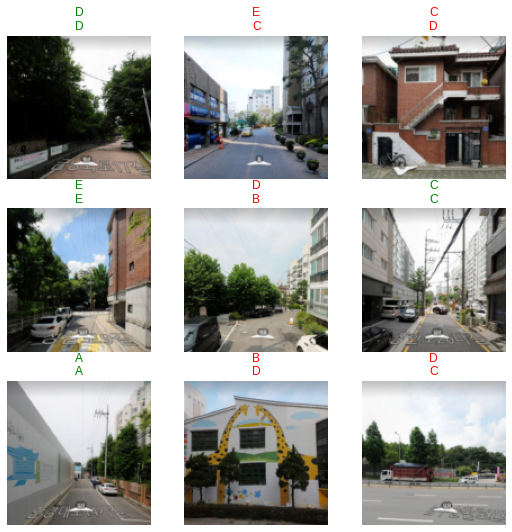

In [ ]:
learn_theft_50.show_results()

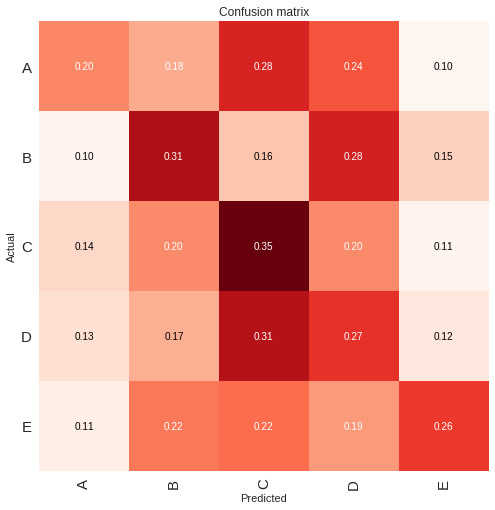

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_theft_50)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

## 6.6. 폭행 관련

- base line : 548/2663 = 20.6% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
- resnet18 : epoch 1에서 early stop했을 때, accuracy가 0.244361
- resnet50 : epoch 2에서 early stop했을 때, accuracy가 0.283835
- 결론
  - resnet18, resnet50 모두 베이스라인인 0.206에서 크게 벗어나지 않았다는 것을 확인할 수 있다. 
  - resnet 레이어 개수는 accuracy에 큰 영향을 안준다는 것을 확인할 수 있다.
  - confusion matrix를 보면 하나의 Actual값에 대해 특정 값을 predict하지 않는 다는 것을 알 수 있다. (대부분 0.2에서 수렴하는 것으로 확인할 수 있다.)
  - 위 근거들을 토대로 로드맵 사진으로 폭행 범죄 등급을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 

In [ ]:
# A~E 레이블 개수 확인하기 위해 groupby() 이용
crime_df.groupby(crime_df['Violence_level']).size()

Violence_level
A    538
B    548
C    529
D    540
E    508
dtype: int64

### 6.6.1. Resnet18

In [ ]:
learn_violence = cnn_learner(dls_violence, resnet50, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_violence.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.894782,2.983211,0.219925,00:49


Better model found at epoch 0 with accuracy value: 0.21992480754852295.


epoch,train_loss,valid_loss,accuracy,time
0,1.849976,2.350418,0.201128,00:50
1,1.336985,2.241404,0.244361,00:51
2,0.942086,2.370280,0.227444,00:51
3,0.628131,2.649145,0.225564,00:52
4,0.403015,2.939478,0.212406,00:50
5,0.251435,3.193298,0.227444,00:50
6,0.158152,3.484371,0.191729,00:52


Better model found at epoch 0 with accuracy value: 0.2011278122663498.
Better model found at epoch 1 with accuracy value: 0.24436090886592865.
No improvement since epoch 1: early stopping


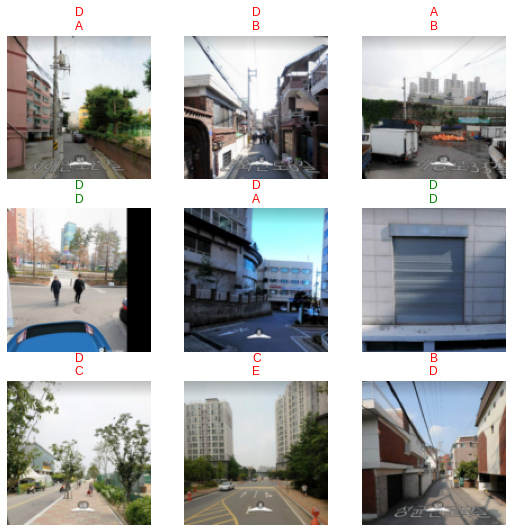

In [ ]:
learn_violence.show_results()

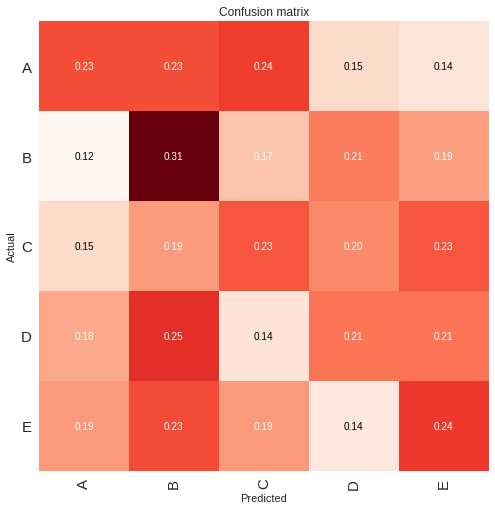

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_violence)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

### 6.6.2. Resnet50

In [ ]:
learn_violence_50 = cnn_learner(dls_violence, resnet50, metrics=accuracy).to_fp16() # resnet 18, 34, 50, 101, 152
learn_violence_50.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='accuracy', patience=5),SaveModelCallback(monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,2.768306,2.933893,0.238722,00:50


Better model found at epoch 0 with accuracy value: 0.2387218028306961.


epoch,train_loss,valid_loss,accuracy,time
0,1.804309,2.227865,0.259398,00:52
1,1.268595,2.179636,0.253759,00:50
2,0.903415,2.279826,0.283835,00:51
3,0.598161,2.573001,0.257519,00:52
4,0.378546,2.891640,0.244361,00:53
5,0.237175,3.052740,0.266917,00:53
6,0.148345,3.240840,0.257519,00:50
7,0.096210,3.508495,0.253759,00:51


Better model found at epoch 0 with accuracy value: 0.259398490190506.
Better model found at epoch 2 with accuracy value: 0.2838345766067505.
No improvement since epoch 2: early stopping


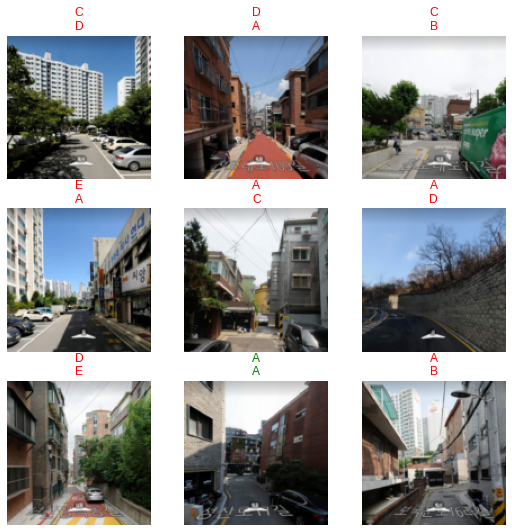

In [ ]:
learn_violence_50.show_results()

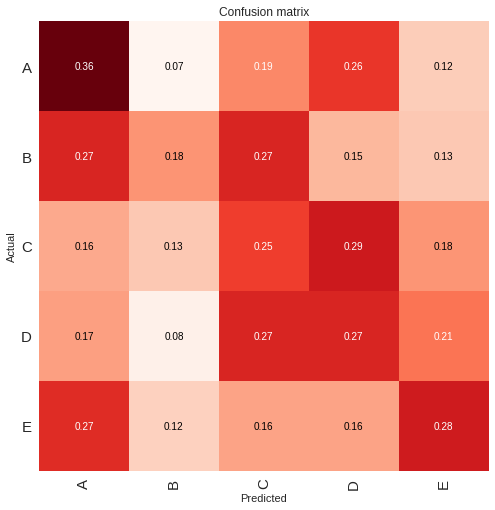

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_violence_50)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

# 7. Weaknesses of Data & Model



## 7.1. Coarse-grained Data

- 서울시의 범죄 수를 볼 수 있는 가장 작은 범위가 '구' 단위이다. 
  - 평균적으로 하나의 구 안에 38만 명의 인구가 살고 있고 면적 또한 넓은 구 단위에서 모든 동네가 같은 특징을 공유하고 있을 것이라 기대하기 힘들다. 
  - 그러나 이번 연구에서 하나의 구는 하나의 레이블을 공유하고 있으므로 다양한 동네가 각 특성을 보존하지 못한 채 같은 레이블을 가지고 있게 되면서 범죄 등급 예측에 실패하였다. 
- 서울시 행정동 수준의 범죄분포에 대한 탐색적 연구(장현석, 2021)에서 범죄 등급을 행정동 단위에서 예측한 자료가 있으나 이것은 ground truth의 문제가 존재한다. 
  - 행정동 단위의 범죄 지도 예시

    <img src = 'https://cdnweb01.wikitree.co.kr/webdata/editor/202108/30/img_20210830160451_72a19aee.webp' width=400 height=350>

## 7.2. Is there a difference in road view by distriction?

- 서울 시내의 로드뷰는 구 또는 권역과는 상관 없이 비슷한 경우가 많았다. 
  - 가장 비슷한 로드뷰들은 아파트 단지 내와 도로인데, 서울 내 많은 아파트들은 10층 이상의 고층 아파트로 이루어져있으며 10년 이상의 연식이 있는 아파트의 경우 외관도 거의 비슷하다. 또한 도로는 중간에 길게 도로가 있으며 양 옆에는 가로수들과 건물이 있는 경우가 대부분이다.
  - 그렇기에 로드뷰가 과연 그 지역의 지역성을 잘 보여주는 것이 맞는가라는 의문으로 이어지게 되었다.


- **서울 시내의 로드뷰 예시**

|동작 아파트|강남 아파트|강북 아파트|
|:-:|:-:|:-:|
|![First Image](https://drive.google.com/uc?id=1bonrOmBx3e7FtPjBYVOsaPB9OohPmZhW)|![Second Image](https://drive.google.com/uc?id=1Cmg2-lQvDs-tIRZ0YjpkZOPafDgZZdcW)|![Second Image](https://drive.google.com/uc?id=15Tce6P51dN3XHEBXytVq4C2ts99dYkfw)|


---


|강북 도로|광진 도로|강서 도로|
|:-:|:-:|:-:|
|![](https://drive.google.com/uc?id=1DSiBVRCLYf4xdGeSVBikMjenxfEkcSAn)|![](https://drive.google.com/uc?id=1RVvizXxzeqfHXEeXMjLdmif2zYKyYmiO)|![](https://drive.google.com/uc?id=1x-MUC0MXc9FwFaRBisVczMsU51M_I31n)|


---
|금천 골목|종로 골목|구로 골목|
|:-:|:-:|:-:|
|![](https://drive.google.com/uc?id=1TlcYCU2drk_FjkealOC5MzoriICiOg_d)|![](https://drive.google.com/uc?id=1uw7HVIOdzDu-tFV-dKYptbgnmZnYPGjm)|![](https://drive.google.com/uc?id=1z3as2_IG1ZyisOouioO2iXm84KSiWAJU)


- 위와 같이, 서로 다른 지역의 로드뷰가 상당히 유사한 경우가 많았다. 
- 따라서 로드뷰에 해당 지역의 지역성이 강하게 드러나는지를 확인하고자, 로드뷰들의 권역을 나누어 classification이 잘 되는지를 알아보았다.
- 서울의 권역은 일반적으로 서울시를 나눌 때 사용되는 도심권, 서북권, 동북권, 서남권, 동남권 5개로 나누었다. 
 
 <img src = 'https://drive.google.com/uc?id=1tf8ZEl6oazWvdQXEtn9WjSgRjZrSM8OY' width=400 height=350>

### 7.2.1. Labeling District Data

- {구 이름 : 권역} 형식의 사전을 만들어 crime_df에 mapping 시켜 target label을 만들어주었다. 

In [ ]:
seoul_district = {'Gangnam':'East-South','Gangdong':'East-South','Gangbuk':'East-North','Gangseo':'West-South',
        'Gwanak':'West-South','Gwangjin':'East-North','Guro':'West-South','Geumcheon':'West-South',
        'Nowon':'East-North','Dobong':'East-North','Dongdaemun':'East-North','Dongjak':'West-South',
        'Mapo':'West-North','Seodaemun':'West-North','Seocho':'East-South','Seongdong':'East-North',
        'Seongbuk':'East-North','Songpa':'East-South','Yangcheon':'West-South','Yeongdeungpo':'West-South',
        'Eunpyeong':'West-North', 'Jongno':'Center','Jung':'Center','Jungnang':'East-North',
        'Yongsan':'Center'}
crime_df['district'] = crime_df['GU'].map(seoul_district)
crime_df.head()

,Path,GU,Total_level,Murder_level,Robbery_level,Rape_level,Theft_level,Violence_level,district
0,/content/cropped_img_data/cropped_img_data/Dongdaemun/Dongdaemun_crop_115.png,Dongdaemun,C,D,C,A,C,C,East-North
1,/content/cropped_img_data/cropped_img_data/Dongdaemun/Dongdaemun_crop_78.png,Dongdaemun,C,D,C,A,C,C,East-North
2,/content/cropped_img_data/cropped_img_data/Dongdaemun/Dongdaemun_crop_102.png,Dongdaemun,C,D,C,A,C,C,East-North
3,/content/cropped_img_data/cropped_img_data/Dongdaemun/Dongdaemun_crop_59.png,Dongdaemun,C,D,C,A,C,C,East-North
4,/content/cropped_img_data/cropped_img_data/Dongdaemun/Dongdaemun_crop_108.png,Dongdaemun,C,D,C,A,C,C,East-North


### 7.2.2. Simple EDA

- 권역 별 데이터 개수를 확인하기 위한 bar plot을 그려주었다. 
- 레이블 마다 데이터 개수의 차이가 많이 나기 때문에(imbalanced data), 모델의 성능을 평가할 때 F1-score도 함께 살펴보기로 한다. 

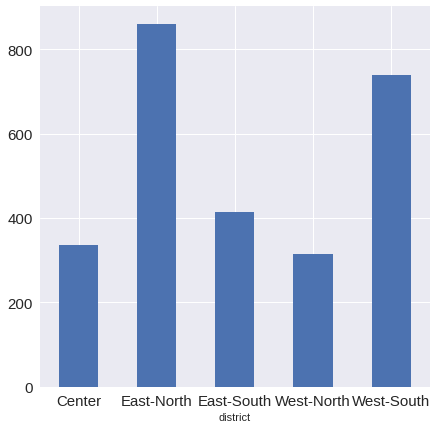

In [ ]:
df_by_group = crime_df.groupby(crime_df['district']).size()
df_by_group.plot.bar(x='group',y='xval',rot=0, figsize=(7,7))

### 7.2.3. Prepare Data for CNN 

In [ ]:
my_random_seed = 42

In [ ]:
dls_district = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_x=ColReader('Path'), 
    get_y=ColReader('district'),
    splitter=RandomSplitter(valid_pct=0.2, seed=my_random_seed),
    item_tfms=Resize(128)
).dataloaders(crime_df)

In [ ]:
len(dls_district.train_ds), len(dls_district.valid_ds)

(2131, 532)

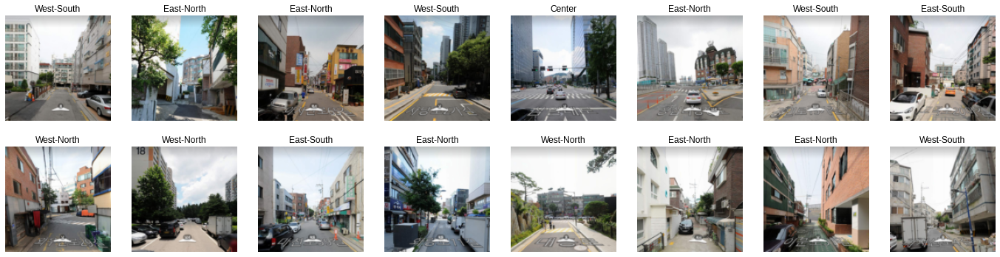

In [ ]:
# show image examples

dls_district.show_batch(max_n=16, nrows=2)

### 7.2.4. Train CNN Model

- base line : 859/2663 = 32.3% 
  - base line = 가장 많은 레이블의 수 / 전체 데이터 수
- resnet18 : epoch 14에서 early stop했을 때, f1score가 0.269407, accuracy가 0.345865
- 결론
  - accuracy를 확인해보면 베이스라인인 0.323에서 크게 벗어나지 않았으며 F1-score도 상당히 낮다는 것을 알 수 있다. 
  - confusion matrix를 보면 레이블의 수가 가장 많았던 동북권과 서남권을 주로 예측하는 문제가 발생했음을 확인할 수 있다. 
  - 위 근거들을 토대로 로드맵 사진으로 서울시 권역을 예측하는 모델의 성능은 굉장히 낮다고 평가할 수 있다. 
  - 따라서 현재 가지고 있는 로드뷰 데이터셋은 각 지역의 지역성을 잘 가지고 있지 않으며, 서로 구분하기 어렵다는 것을 결론내릴 수 있다. 또한 이것으로 보아 서울의 구 단위로 로드뷰를 통해 지역성 feature를 추출하고 이를 가지고 범죄 등급을 예측하는 것은 힘들 것으로 결론 내릴 수 있다. 
- 추가적으로, 로드뷰의 특성 상 낮 시간에 주로 촬영이 이루어져 주로 범죄가 일어날 것이라 예상되는 시간대의 해당 구의 지역성을 잘 가지고 있지 않을 가능성 또한 배제할 수 없다. 

In [ ]:
# f1 score matrix를 정의한 뒤에 평가지표로 accuracy와 함께 사용
f1_score_multi = F1Score(average="macro")
learn_district = cnn_learner(dls_district, resnet18, metrics=[f1_score_multi,accuracy]).to_fp16()
learn_district.fine_tune(50, cbs=[EarlyStoppingCallback(monitor='f1_score', patience=5),SaveModelCallback(monitor='f1_score')])

epoch,train_loss,valid_loss,f1_score,accuracy,time
0,2.628736,2.072857,0.217544,0.233083,00:45


Better model found at epoch 0 with f1_score value: 0.21754382017115242.


epoch,train_loss,valid_loss,f1_score,accuracy,time
0,2.002973,1.904712,0.218219,0.261278,00:45
1,1.699401,1.860762,0.235026,0.293233,00:45
2,1.467563,1.891432,0.243313,0.295113,00:46
3,1.246502,1.941571,0.244621,0.300752,00:47
4,1.011140,2.032032,0.239903,0.298872,00:45
5,0.789758,2.147049,0.230509,0.289474,00:46
6,0.579028,2.276213,0.248185,0.317669,00:46
7,0.396325,2.506855,0.239911,0.306391,00:46
8,0.269520,2.703561,0.248014,0.312030,00:45
9,0.187291,2.941756,0.233211,0.308271,00:46


Better model found at epoch 0 with f1_score value: 0.21821879895849583.
Better model found at epoch 1 with f1_score value: 0.2350261445118588.
Better model found at epoch 2 with f1_score value: 0.2433127466224642.
Better model found at epoch 3 with f1_score value: 0.24462095995938044.
Better model found at epoch 6 with f1_score value: 0.24818483134937788.
Better model found at epoch 10 with f1_score value: 0.25181956072096917.
Better model found at epoch 12 with f1_score value: 0.2537989193722027.
Better model found at epoch 13 with f1_score value: 0.25886476245838574.
Better model found at epoch 14 with f1_score value: 0.2694065364597475.
No improvement since epoch 14: early stopping


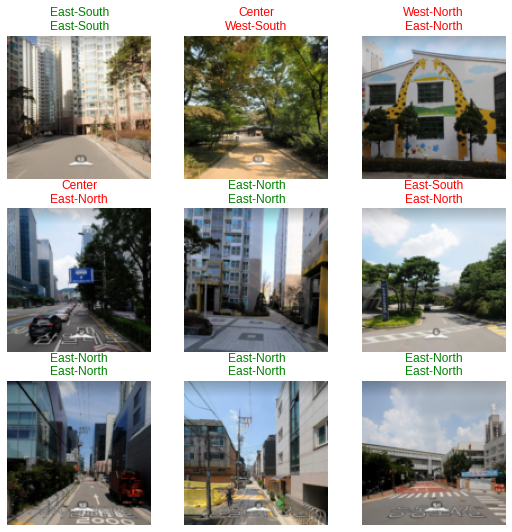

In [ ]:
learn_district.show_results()

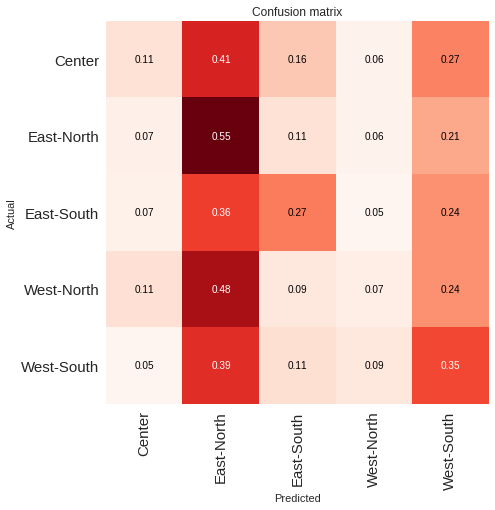

In [ ]:
interp = ClassificationInterpretation.from_learner(learn_district)
interp.plot_confusion_matrix(normalize=True, cmap='Reds', figsize=(7,7))

# 8. Conclusion & Future Applications & References

## 8.1. Conlusion

- 로드뷰를 통해 서울 시내의 범죄 위험도를 예측하는 연구는 현재 범죄 발생 횟수가 공개되어 있는 가장 단위였던 구 단위로 진행되었다. 5대 범죄 및 그 합계로 총 6개의 모델을 만들었고, 각각의 지표에서 로드뷰를 통한 범죄 위험도 예측을 실시하였다. 가장 간단한 pre-trained CNN model인 resnet18을 비롯하여 resnet50으로 학습하였다. 각 모델마다 accuracy 또는 f1-score(imbalanced data인 경우), 예측 결과 그리고 confusion matrix를 통해 범죄 위험도 예측 모델을 평가하였다. 결과적으로, 서울 시내의 범죄 위험도를 로드뷰 사진을 통해 예측하려는 모델은 실패하였다. 5대 범죄(살인, 강도, 강간, 절도 ,폭행) 및 5대 범죄 합계의 범죄 위험도를 예측하는 총 6개의 모델 전부 layer의 개수와는 큰 상관 없이 base line에서 크게 벗어나지 않는 accuracy를 보였다. 
- 예상되는 가장 큰 실패의 요인은 범죄가 지리적으로 어떻게 분포되어 있는지, 어떤 범죄가 어떤 장소에서 일어났는지 등의 raw 데이터가 없어 구 단위로 범죄위험도를 살펴볼 수밖에  없었다는 점이다. 가장 이상적인 연구 방향은 실제로 범죄가 일어난 구간을 레이블링하는 것이었지만, 너무 큰 구 단위로 범죄 위험도를 레이블링 하며 실제 범죄 발생 구간과는 큰 차이를 보이게 되었다. 이러한 문제들로 이미지와 레이블 간의 괴리가 있었으며, 그 결과 낮은 정확도라는 결과로 이어지게 되었다. 
- 다만 로드뷰를 통해 범죄 위험도를 예측할 수 있으며 더 나아가 Semantic Segmentation을 통해 직접적으로 범죄에 영향을 끼치는 지형지물의 요소를 알 수 있다면, 범죄를 보다 효과적으로 예방하는데 도움을 줄 수 있을 것이라 예상된다. 그러한 점에서 이번 연구는 로드뷰를 통한 범죄 위험도 예측 및 예방 연구의 초석이라 생각되며, 추후에 다른 지표를 통합함으로써 좀 더 정교해질 것이라 추측한다.  

## 8.2. Future Applications

 1. 분석 단위를 구(區)가 아닌 동(洞)을 기준으로 하는 방법
  - 서울시 행정동 수준의 범죄분포에 대한 탐색적 연구(장현석, 2021)에서 발표한 서울시 행정동 단위의 범죄지도를 사용할 수 있음
      - 예시

        <img src = 'https://drive.google.com/uc?id=1VUsFvFOFZOhsY0BjZHnBfJpU1xdWS_Q9' width=400 height=350>
  - 생활 안전 지도(https://www.safemap.go.kr/main/smap.do) 를 활용하여 지구대/파출소 단위로 살펴볼 수 있음
      - 단, 하나의 지구대가 여러 동을 관할할 수 있으며, 범죄의 수가 아닌 등급으로 표시됨
      - 예시

        <img src = 'https://drive.google.com/uc?id=1LpI35v52KGesSDLGlK_ZOzvrmYcO6oYr' width=400 height=350>

2. 분석 단위를 구(區)가 아닌 도로(道路)를 기준으로 하는 방법
  - 생활 안전 지도(https://www.safemap.go.kr/main/smap.do) 를 활용하여 도로 별 범죄 위험도를 1 ~ 10 등급으로 살펴볼 수 있음
    - 단, 도로를 세분화하여 범죄 위험도를 측정했으며, tabular 데이터로 만들기 어렵다는 단점이 있음
    - 예시

       <img src = 'https://drive.google.com/uc?id=1PqD4PqPSfp4Ik4Wr5JwDc1X_ygx00uBn' width=400 height=350>

3. 다른 지표를 input에 포함하는 방법
  - 범죄에 영향을 줄 것이라 예측되는 다른 지표들도 함께 input으로 넣어줄 수 있음
  - 도심부터의 거리
    - 시카고학파의 사회해체이론에서는 시카고 지역을 도심으로부터 바깥쪽으로 동심원을 그려서 범죄율을 비교한 결과 도시의 중심부 지역의 범죄율이 다른 지역에 비하여 항상 높게 형성되며 도시 외곽으로 갈수록 범죄율이 낮게 형성된다고 시사함(shaw & mckay, 1969)
    - 실제로 서울 안에서도 범죄가 자주 일어나는 핫스팟과 일어나지 않는 콜드스팟이 확실하게 구분되는데, 주로 상업지구이 핫스팟인 경우가 많다는 점을 착안하여 모델의 input에 도심부텅의 거리를 포함하면 모델의 예측도를 높일 수 있을 것이라 판단함

  - 집중된 불이익 지표(concentrated disadvantage index)
    - 시카고학파에서는 비행의 지역적 분포와 환경적 특징의 관계를 분석하였고, 그 결과 불이익이 집중된 지역에서 비행률이 높았으며, 그 비행율은 지역 내 구성원이 변화해도 유지된다는 결과를 발표함 (shaw & mckay, 1969)
    - 대표적인 불이익 지표 : 빈곤율, 가족붕괴율, 인종/민족 분화지수, 전출입 비율 등
  - 로드뷰 이미지로 범죄 위험도를 예측하는 모델을 만든 후, 모델의 output(범죄 위험도)을 다시 도심부터의 거리, 집중된 불이익 지표 등의 다른 지표와 함께 regression 등의 input으로 사용함으로써 좀 더 정교한 모델을 만들 수 있을 것이라 판단됨


## 8.3. References

- 서울시 행정동 수준의 범죄분포에 대한 탐색적 연구 (장현석, 2021)
-  Social change and crime rate trends: A routine activity  approach (cohen & felson, 1979)
- Juvenile delinquency and urban areas (shaw & mckay, 1969)